<a href="https://colab.research.google.com/github/Y4S1-Deep-Learning/Leaf-Desease-Detection---Supervised-Learning/blob/thisara/Faster_R_CNN_with_Detectron2%20final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install Detectron2 Dependencies

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==2.0.0 torchvision -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 619.9/619.9 MB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 74.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.0/21.0 MB 55.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 849.3/849.3 kB 51.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 107.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 557.1/557.1 MB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.1/317.1 MB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.4/168.4 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 MB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.6/102.6 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 173.2/173.2 MB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
# install detectron2:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-69g76chh
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-69g76chh
  Resolved https://github.com/facebookresearch/detectron2.git to commit 4e80df1e58901557e2824ce3b488d30209a9be33
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for detectron2: filename=detectron2-0.6-

In [3]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [4]:
!curl -L "https://app.roboflow.com/ds/TxTz3KHSof?key=mPgWwkRWo9" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0   2406      0 --:--:-- --:--:-- --:--:--  2410
100 16.4M  100 16.4M    0     0  17.8M      0 --:--:-- --:--:-- --:--:--  271M
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/0000_jpg.rf.8822fca7b538aff733a2ecaa6a1e0d04.jpg  
 extracting: test/003_JPG_jpg.rf.a82832520483d8461c8912457450ba86.jpg  
 extracting: test/009-e1373768789869_jpg.rf.67ac892a7e13913863759837c1202a1d.jpg  
 extracting: test/00pe_jpg.rf.22be39f0803173d14264e38dce2db66b.jpg  
 extracting: test/02_-Rust-2017-207u24s_jpg.rf.0e93e1094d4e3b7d2365903e0d331af7.jpg  
 extracting: test/05-069f12_jpg.rf.530b648a59abd848c17d2c78c6eb6294.jpg  
 extracting: test/0796_33anthracn_jpg.rf.21fca88881d08764733825cc86ac79f6.jpg  
 extracting: test/0805Fig3400_jpg

In [6]:
# import random
# from PIL import Image
# import os

# image_files = os.listdir('/content/train/')

# for image_file in image_files:
#     image = Image.open(f'content/train/{image_file}')

#     # Flip the image horizontally or vertically with a 50% probability.
#     if random.random() < 0.5:
#         image = image.transpose(Image.FLIP_LEFT_RIGHT)
#     elif random.random() < 0.5:
#         image = image.transpose(Image.FLIP_TOP_BOTTOM)

#     image.save(f'content/train/augmented{image_file}')

FileNotFoundError: ignored

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [10/12 17:15:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 17:15:57 d2.data.datasets.coco]: Loaded 3432 images in COCO format from /content/train/_annotations.coco.json


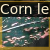

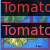

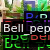

In [8]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [9]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [10]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 4500
cfg.SOLVER.STEPS = (4000, 5000)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 31
cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/12 17:16:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_68b088.pkl: 421MB [00:01, 250MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/12 17:16:03 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[10/12 17:16:48 d2.utils.events]:  eta: 2:17:29  iter: 19  total_loss: 4.344  loss_cls: 3.36  loss_box_reg: 0.7886  loss_rpn_cls: 0.1512  loss_rpn_loc: 0.02365    time: 1.8025  last_time: 1.7630  data_time: 0.0419  last_data_time: 0.0164   lr: 1.9981e-05  max_mem: 6869M
[10/12 17:17:35 d2.utils.events]:  eta: 2:23:59  iter: 39  total_loss: 3.723  loss_cls: 2.782  loss_box_reg: 0.857  loss_rpn_cls: 0.04679  loss_rpn_loc: 0.01895    time: 1.9668  last_time: 2.2055  data_time: 0.0249  last_data_time: 0.0433   lr: 3.9961e-05  max_mem: 6869M
[10/12 17:18:17 d2.utils.events]:  eta: 2:25:19  iter: 59  total_loss: 2.511  loss_cls: 1.437  loss_box_reg: 0.8186  loss_rpn_cls: 0.06303  loss_rpn_loc: 0.02606    time: 2.0074  last_time: 2.0202  data_time: 0.0291  last_data_time: 0.0409   lr: 5.9941e-05  max_mem: 6870M
[10/12 17:19:01 d2.utils.events]:  eta: 2:29:03  iter: 79  total_loss: 2.137  loss_cls: 1.163  loss_box_reg: 0.871  loss_rpn_cls: 0.06234  loss_rpn_loc: 0.02614    time: 2.0504  last_t

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 17:34:02 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0014 s/iter. Inference: 0.1909 s/iter. Eval: 0.0003 s/iter. Total: 0.1927 s/iter. ETA=0:01:32
[10/12 17:34:07 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0020 s/iter. Inference: 0.1912 s/iter. Eval: 0.0003 s/iter. Total: 0.1936 s/iter. ETA=0:01:27
[10/12 17:34:12 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0038 s/iter. Inference: 0.1915 s/iter. Eval: 0.0004 s/iter. Total: 0.1958 s/iter. ETA=0:01:23
[10/12 17:34:17 d2.evaluation.evaluator]: Inference done 89/491. Dataloading: 0.0042 s/iter. Inference: 0.1915 s/iter. Eval: 0.0004 s/iter. Total: 0.1963 s/iter. ETA=0:01:18
[10/12 17:34:22 d2.evaluation.evaluator]: Inference done 115/491. Dataloading: 0.0038 s/iter. Inference: 0.1916 s/iter. Eval: 0.0004 s/iter. Total: 0.1958 s/iter. ETA=0:01:13
[10/12 17:34:27 d2.evaluation.evaluator]: Inference done 141/491. Dataloading: 0.0041 s/iter. Inference: 0.1916 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 17:53:15 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0012 s/iter. Inference: 0.1911 s/iter. Eval: 0.0004 s/iter. Total: 0.1927 s/iter. ETA=0:01:32
[10/12 17:53:20 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0057 s/iter. Inference: 0.1914 s/iter. Eval: 0.0004 s/iter. Total: 0.1977 s/iter. ETA=0:01:29
[10/12 17:53:25 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0052 s/iter. Inference: 0.1919 s/iter. Eval: 0.0004 s/iter. Total: 0.1978 s/iter. ETA=0:01:24
[10/12 17:53:30 d2.evaluation.evaluator]: Inference done 89/491. Dataloading: 0.0042 s/iter. Inference: 0.1918 s/iter. Eval: 0.0004 s/iter. Total: 0.1966 s/iter. ETA=0:01:19
[10/12 17:53:36 d2.evaluation.evaluator]: Inference done 115/491. Dataloading: 0.0049 s/iter. Inference: 0.1919 s/iter. Eval: 0.0004 s/iter. Total: 0.1974 s/iter. ETA=0:01:14
[10/12 17:53:41 d2.evaluation.evaluator]: Inference done 141/491. Dataloading: 0.0047 s/iter. Inference: 0.1918 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 18:12:34 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0011 s/iter. Inference: 0.1920 s/iter. Eval: 0.0004 s/iter. Total: 0.1935 s/iter. ETA=0:01:32
[10/12 18:12:39 d2.evaluation.evaluator]: Inference done 36/491. Dataloading: 0.0080 s/iter. Inference: 0.1916 s/iter. Eval: 0.0005 s/iter. Total: 0.2002 s/iter. ETA=0:01:31
[10/12 18:12:44 d2.evaluation.evaluator]: Inference done 62/491. Dataloading: 0.0053 s/iter. Inference: 0.1919 s/iter. Eval: 0.0004 s/iter. Total: 0.1977 s/iter. ETA=0:01:24
[10/12 18:12:49 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0043 s/iter. Inference: 0.1919 s/iter. Eval: 0.0004 s/iter. Total: 0.1966 s/iter. ETA=0:01:19
[10/12 18:12:54 d2.evaluation.evaluator]: Inference done 113/491. Dataloading: 0.0053 s/iter. Inference: 0.1920 s/iter. Eval: 0.0004 s/iter. Total: 0.1978 s/iter. ETA=0:01:14
[10/12 18:12:59 d2.evaluation.evaluator]: Inference done 139/491. Dataloading: 0.0046 s/iter. Inference: 0.1920 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 18:31:50 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0014 s/iter. Inference: 0.1915 s/iter. Eval: 0.0004 s/iter. Total: 0.1932 s/iter. ETA=0:01:32
[10/12 18:31:55 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0021 s/iter. Inference: 0.1907 s/iter. Eval: 0.0003 s/iter. Total: 0.1933 s/iter. ETA=0:01:27
[10/12 18:32:00 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0038 s/iter. Inference: 0.1916 s/iter. Eval: 0.0004 s/iter. Total: 0.1959 s/iter. ETA=0:01:23
[10/12 18:32:05 d2.evaluation.evaluator]: Inference done 89/491. Dataloading: 0.0036 s/iter. Inference: 0.1915 s/iter. Eval: 0.0004 s/iter. Total: 0.1957 s/iter. ETA=0:01:18
[10/12 18:32:10 d2.evaluation.evaluator]: Inference done 114/491. Dataloading: 0.0032 s/iter. Inference: 0.1946 s/iter. Eval: 0.0004 s/iter. Total: 0.1983 s/iter. ETA=0:01:14
[10/12 18:32:15 d2.evaluation.evaluator]: Inference done 140/491. Dataloading: 0.0038 s/iter. Inference: 0.1940 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 18:51:16 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0012 s/iter. Inference: 0.1914 s/iter. Eval: 0.0003 s/iter. Total: 0.1929 s/iter. ETA=0:01:32
[10/12 18:51:21 d2.evaluation.evaluator]: Inference done 36/491. Dataloading: 0.0025 s/iter. Inference: 0.2015 s/iter. Eval: 0.0003 s/iter. Total: 0.2045 s/iter. ETA=0:01:33
[10/12 18:51:26 d2.evaluation.evaluator]: Inference done 62/491. Dataloading: 0.0038 s/iter. Inference: 0.1972 s/iter. Eval: 0.0004 s/iter. Total: 0.2016 s/iter. ETA=0:01:26
[10/12 18:51:31 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0033 s/iter. Inference: 0.1952 s/iter. Eval: 0.0004 s/iter. Total: 0.1991 s/iter. ETA=0:01:20
[10/12 18:51:36 d2.evaluation.evaluator]: Inference done 114/491. Dataloading: 0.0034 s/iter. Inference: 0.1943 s/iter. Eval: 0.0004 s/iter. Total: 0.1982 s/iter. ETA=0:01:14
[10/12 18:51:42 d2.evaluation.evaluator]: Inference done 140/491. Dataloading: 0.0039 s/iter. Inference: 0.1938 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 19:10:37 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0012 s/iter. Inference: 0.1932 s/iter. Eval: 0.0004 s/iter. Total: 0.1948 s/iter. ETA=0:01:33
[10/12 19:10:42 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0021 s/iter. Inference: 0.1916 s/iter. Eval: 0.0004 s/iter. Total: 0.1943 s/iter. ETA=0:01:28
[10/12 19:10:47 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0032 s/iter. Inference: 0.1917 s/iter. Eval: 0.0004 s/iter. Total: 0.1954 s/iter. ETA=0:01:23
[10/12 19:10:52 d2.evaluation.evaluator]: Inference done 89/491. Dataloading: 0.0041 s/iter. Inference: 0.1919 s/iter. Eval: 0.0004 s/iter. Total: 0.1965 s/iter. ETA=0:01:18
[10/12 19:10:57 d2.evaluation.evaluator]: Inference done 115/491. Dataloading: 0.0037 s/iter. Inference: 0.1918 s/iter. Eval: 0.0004 s/iter. Total: 0.1960 s/iter. ETA=0:01:13
[10/12 19:11:02 d2.evaluation.evaluator]: Inference done 141/491. Dataloading: 0.0039 s/iter. Inference: 0.1917 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 19:29:49 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0014 s/iter. Inference: 0.1926 s/iter. Eval: 0.0003 s/iter. Total: 0.1944 s/iter. ETA=0:01:33
[10/12 19:29:54 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0053 s/iter. Inference: 0.1920 s/iter. Eval: 0.0004 s/iter. Total: 0.1978 s/iter. ETA=0:01:29
[10/12 19:30:00 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0049 s/iter. Inference: 0.1918 s/iter. Eval: 0.0004 s/iter. Total: 0.1973 s/iter. ETA=0:01:24
[10/12 19:30:05 d2.evaluation.evaluator]: Inference done 89/491. Dataloading: 0.0040 s/iter. Inference: 0.1917 s/iter. Eval: 0.0004 s/iter. Total: 0.1963 s/iter. ETA=0:01:18
[10/12 19:30:10 d2.evaluation.evaluator]: Inference done 115/491. Dataloading: 0.0042 s/iter. Inference: 0.1918 s/iter. Eval: 0.0004 s/iter. Total: 0.1966 s/iter. ETA=0:01:13
[10/12 19:30:15 d2.evaluation.evaluator]: Inference done 141/491. Dataloading: 0.0039 s/iter. Inference: 0.1919 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 19:49:04 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0011 s/iter. Inference: 0.1912 s/iter. Eval: 0.0003 s/iter. Total: 0.1927 s/iter. ETA=0:01:32
[10/12 19:49:09 d2.evaluation.evaluator]: Inference done 37/491. Dataloading: 0.0017 s/iter. Inference: 0.1909 s/iter. Eval: 0.0003 s/iter. Total: 0.1931 s/iter. ETA=0:01:27
[10/12 19:49:14 d2.evaluation.evaluator]: Inference done 63/491. Dataloading: 0.0024 s/iter. Inference: 0.1913 s/iter. Eval: 0.0003 s/iter. Total: 0.1942 s/iter. ETA=0:01:23
[10/12 19:49:19 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0041 s/iter. Inference: 0.1914 s/iter. Eval: 0.0004 s/iter. Total: 0.1961 s/iter. ETA=0:01:19
[10/12 19:49:24 d2.evaluation.evaluator]: Inference done 114/491. Dataloading: 0.0037 s/iter. Inference: 0.1914 s/iter. Eval: 0.0004 s/iter. Total: 0.1956 s/iter. ETA=0:01:13
[10/12 19:49:29 d2.evaluation.evaluator]: Inference done 140/491. Dataloading: 0.0038 s/iter. Inference: 0.1914 s/iter. Eval: 0.0

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 20:08:21 d2.evaluation.evaluator]: Inference done 11/491. Dataloading: 0.0079 s/iter. Inference: 0.1916 s/iter. Eval: 0.0005 s/iter. Total: 0.2000 s/iter. ETA=0:01:36
[10/12 20:08:26 d2.evaluation.evaluator]: Inference done 36/491. Dataloading: 0.0084 s/iter. Inference: 0.1914 s/iter. Eval: 0.0004 s/iter. Total: 0.2005 s/iter. ETA=0:01:31
[10/12 20:08:31 d2.evaluation.evaluator]: Inference done 62/491. Dataloading: 0.0056 s/iter. Inference: 0.1909 s/iter. Eval: 0.0004 s/iter. Total: 0.1971 s/iter. ETA=0:01:24
[10/12 20:08:36 d2.evaluation.evaluator]: Inference done 88/491. Dataloading: 0.0044 s/iter. Inference: 0.1909 s/iter. Eval: 0.0004 s/iter. Total: 0.1959 s/iter. ETA=0:01:18
[10/12 20:08:41 d2.evaluation.evaluator]: Inference done 113/491. Dataloading: 0.0052 s/iter. Inference: 0.1914 s/iter. Eval: 0.0004 s/iter. Total: 0.1972 s/iter. ETA=0:01:14
[10/12 20:08:46 d2.evaluation.evaluator]: Inference done 139/491. Dataloading: 0.0046 s/iter. Inference: 0.1915 s/iter. Eval: 0.0

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [12]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[10/12 20:10:03 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
WARNING [10/12 20:10:04 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [10/12 20:10:04 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/12 20:10:04 d2.data.datasets.coco]: Loaded 249 images in COCO format from /content/test/_annotations.coco.json
[10/12 20:10:04 d2.data.build]: Distribution of instances among all 31 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|   diseases    | 0            | Apple Scab .. | 16           |  Apple leaf   | 15           |
| Apple rust .. | 17           | Bell_pepper.. | 10           | Bell_pepper.. | 16        

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[10/12 20:10:06 d2.evaluation.evaluator]: Inference done 11/249. Dataloading: 0.0071 s/iter. Inference: 0.1879 s/iter. Eval: 0.0004 s/iter. Total: 0.1954 s/iter. ETA=0:00:46
[10/12 20:10:11 d2.evaluation.evaluator]: Inference done 37/249. Dataloading: 0.0066 s/iter. Inference: 0.1881 s/iter. Eval: 0.0004 s/iter. Total: 0.1953 s/iter. ETA=0:00:41
[10/12 20:10:16 d2.evaluation.evaluator]: Inference done 63/249. Dataloading: 0.0049 s/iter. Inference: 0.1889 s/iter. Eval: 0.0004 s/iter. Total: 0.1943 s/iter. ETA=0:00:36
[10/12 20:10:22 d2.evaluation.evaluator]: Inference done 89/249. Dataloading: 0.0049 s/iter. Inference: 0.1897 s/iter. Eval: 0.0004 s/iter. Total: 0.1951 s/iter. ETA=0:00:31
[10/12 20:10:27 d2.evaluation.evaluator]: Inference done 115/249. Dataloading: 0.0050 s/iter. Inference: 0.1906 s/iter. Eval: 0.0004 s/iter. Total: 0.1961 s/iter. ETA=0:00:26
[10/12 20:10:32 d2.evaluation.evaluator]: Inference done 141/249. Dataloading: 0.0044 s/iter. Inference: 0.1919 s/iter. Eval: 0.0

OrderedDict([('bbox',
              {'AP': 18.00067910275219,
               'AP50': 27.391384646526568,
               'AP75': 19.56664896483809,
               'APs': 8.842144856359933,
               'APm': 27.357578082109264,
               'APl': 76.1126826968411,
               'AP-diseases': nan,
               'AP-Apple Scab Leaf': 27.536081339529527,
               'AP-Apple leaf': 50.30989286933821,
               'AP-Apple rust leaf': 9.057614513607662,
               'AP-Bell_pepper leaf': 0.3514600800792481,
               'AP-Bell_pepper leaf spot': 1.5988696444265635,
               'AP-Blueberry leaf': 10.523871533721127,
               'AP-Cherry leaf': 9.771075322801204,
               'AP-Corn Gray leaf spot': 23.870418620809446,
               'AP-Corn leaf blight': 19.31043126997236,
               'AP-Corn rust leaf': 45.43737521825205,
               'AP-Peach leaf': 39.029896123729266,
               'AP-Potato leaf': nan,
               'AP-Potato leaf early bl

# Inference with Detectron2 Saved Weights



In [13]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [14]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1697131013.c989ac6f3232.193.0  metrics.json
instances_predictions.pth                          model_final.pth


In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[10/12 20:10:56 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


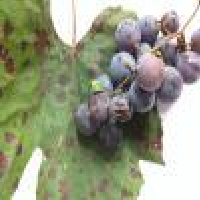

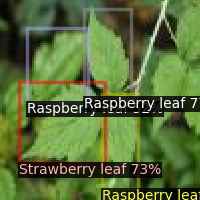

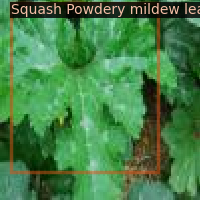

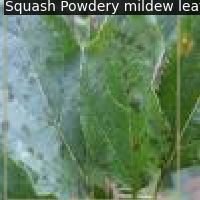

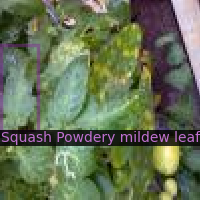

...

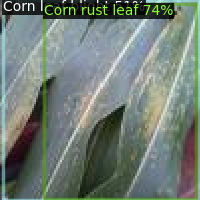

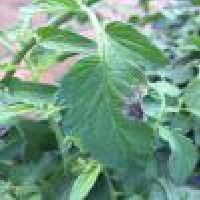

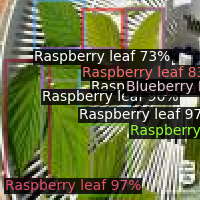

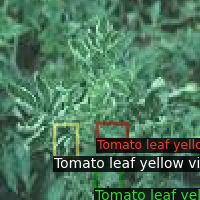

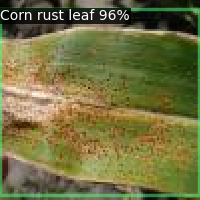

In [16]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=2
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])


In [17]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [18]:
import shutil

# Copy the folder "my_folder" to the Drive root directory recursively.
shutil.copytree("/content/output", "/content/drive/My Drive/dl1/output", True)

'/content/drive/My Drive/dl1/output'